**SETTiNGS**

In [1]:
#Select results to plot ('' will load the most recent assimilation file)
filename = ''
filename=filename.replace('/',':')

import os
wd = '/Users/chrishancock/Library/CloudStorage/OneDrive-NorthernArizonaUniversity/Research/Manuscript/DAMP21k/' #changed
os.chdir(wd+'Holocene-code') #

from eofs.xarray import Eof
# Math Functions
import numpy as np
import scipy.stats
import pandas as pd
import xarray as xr
from scipy.stats import linregress
# Plotting Functions
import matplotlib.pyplot   as plt         # Packages for making figures
import matplotlib.cm       as cm
import matplotlib.gridspec as gridspec
import cartopy.crs         as ccrs        # Packages for mapping in python
import cartopy.feature     as cfeature
import cartopy.util        as cutil
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# DA Functions
import da_utils_plotting as da_plot
import da_load_proxies
import da_load_models
import da_psms
print('packages loaded')
font = {'family': 'sans-serif', 'sans-serif': 'Lucida Grande'}

packages loaded


**===================LOAD DATA===================**

In [2]:
# If don't define a reconstruction, Get the most recent filename
if filename == '':
    filename = [f for f in os.listdir(wd+'Data/results') if os.path.isdir(os.path.join(wd+'Data/results', f))]
    filename = filename[np.argmax([os.path.getmtime(wd+'Data/results/'+f+'/'+f+'.nc') for f in filename])]
print('loading '+filename)
# Load Data
options, DAMPvals, DAMPproxy = da_plot.loadDAMPresults(wd+'Data/results/',filename)

#Define dataframe
proxy_df = pd.DataFrame(DAMPproxy['proxy_metadata'][:,[0,1,2,3,4,5,8,10,12]], columns=['dataSetName','TSid','lat','lon','seasonality_array','season','units','archive','PSM'])
#Convert lat/lons to float
proxy_df['lat'] = [np.float(x) for x in proxy_df['lat']];
proxy_df['lon'] = [np.float(x) for x in proxy_df['lon']];

#Define mapping settings
#options['assimilate_selected_region'] = [15.0, 65.0, 190.0, 360.0]
if options['assimilate_selected_region']:
    lims,proj = [], ccrs.PlateCarree()
    for x in options['assimilate_selected_region']:
        if x < 180: lims.append(x)
        else: lims.append(x-360)
    lims = np.array(lims)[[2,3,0,1]]
else:     
    lims,proj = False, ccrs.Robinson()


loading holocene_recon_2024-02-26_13:07:51.362508_annual_DAMP21ka.8000loc.5000window.500.
DA reconstruction loaded for variables:
['tas [degC]']
['LakeStatus [percentile]']
['precip [mm/day]']


/var/folders/h9/3rpf_h5j01bcy6dw2hfhdm140000gn/T/ipykernel_14346/197247387.py:12: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  proxy_df['lat'] = [np.float(x) for x in proxy_df['lat']];
/var/folders/h9/3rpf_h5j01bcy6dw2hfhdm140000gn/T/ipykernel_14346/197247387.py:13: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  proxy_df['lon'] = [np.floa

In [3]:
import xesmf as xe
#Set up land mask
from global_land_mask import globe
lon_grid, lat_grid = np.meshgrid(np.array([x-360 if x > 180 else x for x in DAMPvals['precip']['prior'].lon.data])
                                 ,DAMPvals['precip']['prior'].lat)
land = globe.is_land(lat_grid, lon_grid)

****===================10 KA - PRESENT PRECIP PCA===================****

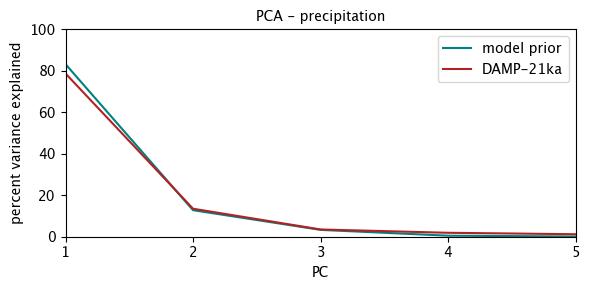

In [4]:
# Do PC and show scree plot
agemin,agemax = 0,21000
extent=False
vn='precip'
vals = {'prior':DAMPvals[vn]['prior'].sel(ages=slice(agemin,agemax)).mean(dim='iteration').rename({'ages':'time'}),
        'recon':DAMPvals[vn]['recon'].sel(ages=slice(agemin,agemax)).mean(dim='iteration').rename({'ages':'time'}),
       }
vals['prior'] = vals['prior'].where(land)
vals['recon'] = vals['recon'].where(land)


wgts =  np.cos(np.deg2rad(vals['prior']['lat'].values))[..., np.newaxis]
PCA = {}
for name in vals.keys(): 
    vals[name].attrs['units'] = 'mm/day' 
    PCA[name]={}
    PCA[name]['solver']   = Eof(vals[name],weights=wgts)
    PCA[name]['%explain'] = PCA[name]['solver'].varianceFraction()
    PCA[name]['eofCor']   = PCA[name]['solver'].eofsAsCorrelation(neofs=5)
    PCA[name]['eofCov']   = PCA[name]['solver'].eofsAsCovariance(neofs=5)
    PCA[name]['pcs']       = PCA[name]['solver'].pcs(npcs=5, pcscaling=1)
    
pclim = max(np.where(PCA['recon']['%explain']>0.005)[0])
#Plot skree plot
plt.figure(figsize=(6,3))
plt.rc('font', **font)
ax = plt.subplot()
#olor=(['teal','firebrick'][col]
ax.plot(np.round(PCA['prior']['%explain']*100,1),c='teal',label='model prior')
ax.plot(np.round(PCA['recon']['%explain']*100,1),c='firebrick',label='DAMP-21ka')
ax.set_ylim([0,100]); ax.set_yticks(range(0,101,20))
ax.set_xlim(0,pclim); ax.set_xticks(range(0,pclim+1)); ax.set_xticklabels(range(1,pclim+2))
ax.tick_params(labelsize=10)
ax.set_xlabel('PC',fontsize=10)
ax.set_ylabel('percent variance explained',fontsize=10)
ax.legend(fontsize=10)
#
plt.title('PCA - precipitation',fontsize=10)
plt.tight_layout()
plt.savefig(wd+'Data/results/'+filename+'/'+'Fig7SM_PCApct'+'_'+vn+'_'+str(int(agemax/1000))+'-0ka.png',dpi=600, bbox_inches ="tight")

In [5]:
orbit2 = pd.read_csv(wd+'Data/insolation_bein1.dat.csv')#, sep="  ", header=None)
orbit2 = orbit2[(orbit2['lat']>=30)]
orbit2 = orbit2[(orbit2['lat']<=80)]
orbit2['DJF'] = orbit2[['Jan','Feb','Dec']].sum(axis=1)
orbit2['JJA'] = orbit2[['Jun','Jul','Aug']].sum(axis=1)
orbit2['ANN'] = orbit2.sum(axis=1)
#
ages = []
djf = []
jja = []
ann = []
for ky in range(-10,1):
    ages.append(abs(ky))
    df = orbit2[(orbit2['ky']==ky)]
    djf.append(round(linregress(df['lat'], df['DJF'])[0],2))
    jja.append(round(linregress(df['lat'], df['JJA'])[0],2))
    ann.append(round(linregress(df['lat'], df['ANN'])[0],2))
ages

[10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]

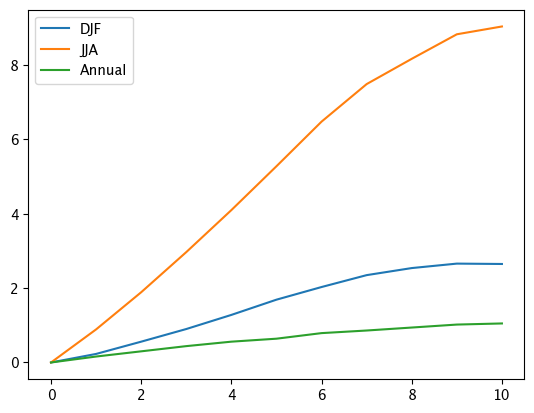

In [6]:
plt.figure()
ax = plt.subplot()
ax.plot(ages,djf-djf[-1],label='DJF')
ax.plot(ages,ann-ann[-1],label='JJA')
ax.plot(ages,jja-jja[-1],label='Annual')
ax.legend()

In [7]:
orbit = pd.read_csv(wd+'Data/orbit91.txt')
orbit['age']=[x*1000 for x in range(0,22)]
print(orbit)
prec = orbit.PREC
prec = (prec - np.mean(prec))/np.std(prec)

obl = orbit.OBL
obl = (obl - np.mean(obl))/np.std(obl)

      age       ECC   OMEGA     OBL     PREC  65NJul  65SJan  15NJul  15SJan
0       0  0.017236  101.37  23.446  0.01690  426.76  455.58  440.60  470.35
1    1000  0.017644   84.26  23.573  0.01756  430.12  455.48  442.48  468.57
2    2000  0.018024   67.23  23.697  0.01662  434.69  454.07  445.62  465.49
3    3000  0.018376   50.30  23.815  0.01414  440.20  451.57  449.77  461.39
4    4000  0.018697   33.45  23.923  0.01031  446.28  448.30  454.60  456.65
5    5000  0.018988   16.68  24.019  0.00545  452.48  444.63  459.67  451.70
6    6000  0.019249  359.99  24.100  0.00000  458.31  441.00  464.53  446.98
7    7000  0.019477  343.37  24.163 -0.00557  463.29  437.78  468.75  442.94
8    8000  0.019674  326.82  24.206 -0.01077  467.00  435.33  471.92  439.91
9    9000  0.019839  310.32  24.229 -0.01513  469.12  433.88  473.76  438.17
10  10000  0.019971  293.86  24.229 -0.01826  469.44  433.59  474.08  437.87
11  11000  0.020071  277.45  24.207 -0.01990  467.92  434.48  472.84  439.05

/var/folders/h9/3rpf_h5j01bcy6dw2hfhdm140000gn/T/ipykernel_14346/892566891.py:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


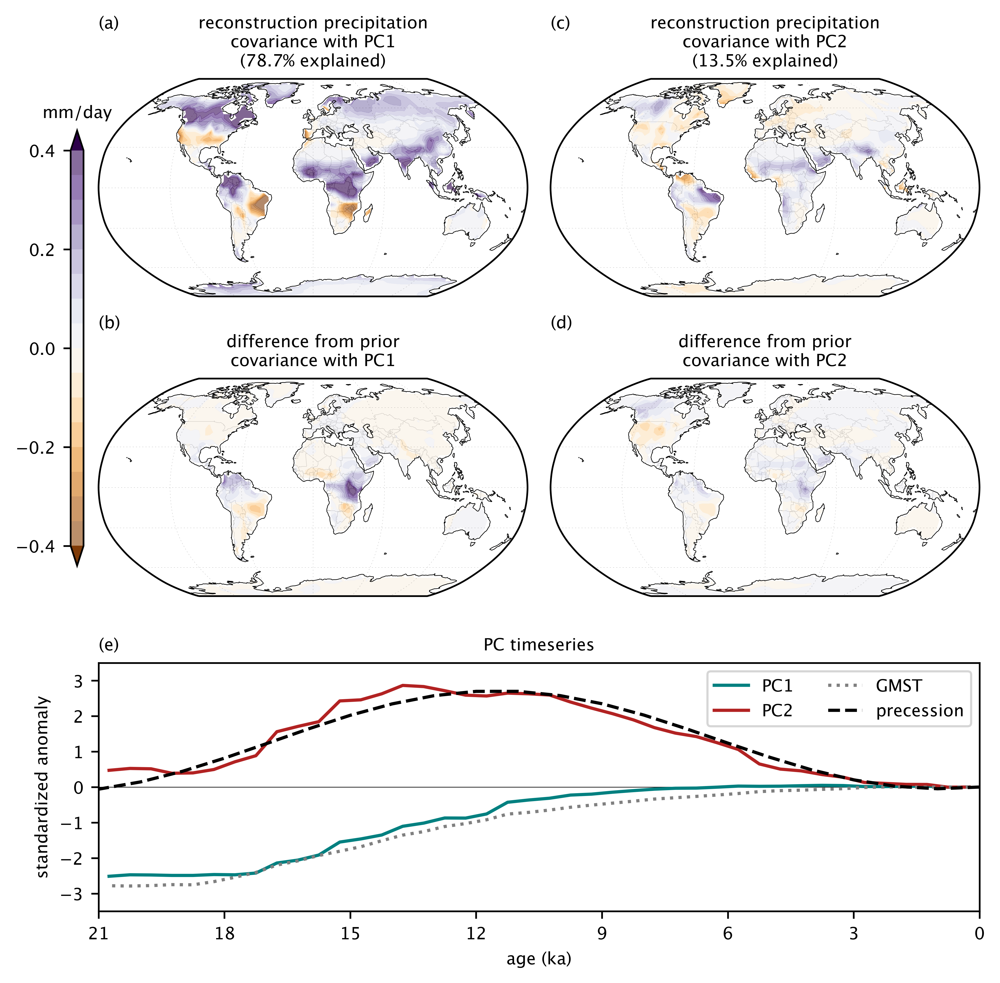

In [8]:
#Plot map
fs=8
#Plot settings
pltype,n,units,v = 'Cov','covariance','mm/day',0.4
#pltype,n,units,v = 'Reg','regression','mm/day',0.4
#pltype,n,units,v = 'Cor','correlation','Correlation Coefficient',1.5
cmap,s = plt.cm.PuOr,1
#Set up plot
plt.figure(figsize=(6.5,6.5),dpi=600)
plt.rc('font', **font)
gs = gridspec.GridSpec(s*2+s,6)#,hspace=0.3)
ax1 = plt.subplot(gs[s*2+s-1,:])
ax1.axhline(0, color='k', linewidth=0.3)
for PC in range(3):
    #Map loadings
    for col,name in enumerate(['recon','recon']):
        #Get Vals
        pct = ' ('+str(np.round((PCA[name]['%explain'][PC]*100).data,1))+'% explained)'
        eof = PCA[name]['eof'+pltype][PC]*1
        pcs = PCA[name]['pcs'][:,PC]*1
        if name == 'prior': 
            if col ==1: eof -=  xr.cov(vals['recon'],pcs,dim='time')
            name1,name2='prior','reconstruction'
        else: 
            if col ==1: eof -=  xr.cov(vals['prior'],pcs,dim='time')
            name1,name2='reconstruction','prior'
        if PC >= 2: continue
        #Check Direction
        if PC == 0: pcs *= -1; eof *= -1
        #Map EOFs
        if pltype == 'Cor': clevs = np.linspace(-v, v, 21)
        else:               clevs = np.linspace(-v, v, 17)
        ax = plt.subplot(gs[(col*s):(col*s+s),(PC*3):(PC*3+3)],projection=proj)        
        label = [['a','b'],['c','d']][PC][col]
        ax.set_title('('+label+')\n'+'\n',loc='left',fontsize=fs)
        if col == 0:   
            pct = str(np.round(PCA[name]['%explain'][PC].data*100,1))
            ax.set_title(name1+' precipitation\ncovariance with PC'+str(PC+1)+'\n('+pct+'% explained)',fontsize=fs)
        elif col == 1: 
            ax.set_title('difference from '+name2+'\ncovariance with PC'+str(PC+1),fontsize=fs)
        da_plot.plotBaseMap(ax,proj,lims)
        if extent: ax.set_extent(extent,crs=ccrs.PlateCarree())
        data_cyclic,lon_cyclic = cutil.add_cyclic_point(eof,coord=eof.lon.data)
        if pltype == 'Cor': p = ax.contourf(lon_cyclic,eof.lat,data_cyclic,alpha=0.6,levels=clevs,cmap=cmap,transform=ccrs.PlateCarree())
        else:               p = ax.contourf(lon_cyclic,eof.lat,data_cyclic,alpha=0.6,levels=clevs,extend='both',cmap=cmap,transform=ccrs.PlateCarree())
        #Map Colorbar
        if (col == 1) & (PC == 0):
            cb = plt.colorbar(p, orientation='vertical', ax=ax, ticks=np.linspace(-v,v,5),
               cax=inset_axes(ax,width="3%",  height="200%", loc='center', bbox_to_anchor=(-0.55,0.64, 1, 1),bbox_transform=ax.transAxes))    
            cb.ax.set_title(units, fontsize=fs)
            cb.ax.tick_params(labelsize=fs)
            cb.ax.yaxis.set_ticks_position('left')
        #Plot timeseries
        if col == 0:
                ax1.plot(pcs.time,pcs-pcs[0],color=(['teal','firebrick'][PC]),
                     linewidth=1.5,linestyle=(['solid','solid'][PC]),label=(['PC','PC'][PC]+str(PC+1)))

            
temp = DAMPvals['tas'][name].mean(dim='iteration')
temp = temp.weighted(np.cos(np.deg2rad(temp.lat))).mean(dim=['lat','lon'])
temp = (temp-np.mean(temp))/np.std(temp)
ax1.plot(temp.ages,temp-temp[0],label='GMST',c='grey',linestyle='dotted',linewidth=1.5)
ax1.plot(orbit.age,-(prec-prec[0]).values,label='precession',c='k',linestyle='dashed',linewidth=1.5)
#ax1.plot(orbit.age,(obl-obl[0]).values,label='OBL',c='r',linestyle='dotted',linewidth=1.5)

ax1.tick_params(labelsize=fs)
ax1.set_xlabel('age (ka)',fontsize= fs);          ax1.set_ylabel('standardized anomaly',fontsize= fs)
ax1.set_xlim((agemin,agemax)); ax1.invert_xaxis();  ax1.set_ylim(-3.5, 3.5)
ax1.set_title('PC timeseries',loc='center', fontsize=fs)
ax1.set_title('(e)',loc='left', fontsize=fs)
ax1.set_xticks(np.linspace(21000,0,8))
ax1.set_xticklabels([str(int(x)) for x in np.linspace(21,0,8)])
ax1.legend(fontsize=fs,ncol=2)
    #
    
plt.tight_layout()
plt.savefig(wd+'Data/results/'+filename+'/'+'Fig7_PCA'+'_'+vn+'_'+str(int(agemax/1000))+'-0ka_'+name+'.png',dpi=600, bbox_inches ="tight")


****===================Test de Wet 2023 Hypothesis===================****

In [9]:
#This results in a steeper LIG latitudinal pressure gradient (Figure 5g) 
#and strong anticyclonic surface wind vector anomalies in the north Pacific relative to the PI

#In prior
    #Stronger pressure gradiant
    #Stronger wind vector anomalies 
    #Greater precipitation

options2={}
for key in options.keys(): options2[key] = options[key]
options2['vars_to_reconstruct'] = ['tas','LakeStatus','precip']
options2['vars_to_reconstruct'].append('U200')
options2['vars_to_reconstruct'].append('V200')
options2['vars_to_reconstruct'].append('slp')
inputArray = da_load_models.load_model_data(options2)

Loading variable tas for model 1/2: DAMP_TraCE_regrid
Loading variable tas for model 2/2: DAMP_HadCM_regrid
Loading variable LakeStatus for model 1/2: DAMP_TraCE_regrid
Loading variable LakeStatus for model 2/2: DAMP_HadCM_regrid


/Users/chrishancock/Library/CloudStorage/OneDrive-NorthernArizonaUniversity/Research/Manuscript/DAMP21k/Holocene-code/da_psms.py:145: RuntimeWarning: invalid value encountered in divide
  ranks = ranks / np.nanmax(ranks)


Loading variable precip for model 1/2: DAMP_TraCE_regrid
Loading variable precip for model 2/2: DAMP_HadCM_regrid
Loading variable U200 for model 1/2: DAMP_TraCE_regrid
Loading variable U200 for model 2/2: DAMP_HadCM_regrid
Loading variable V200 for model 1/2: DAMP_TraCE_regrid
Loading variable V200 for model 2/2: DAMP_HadCM_regrid
Loading variable slp for model 1/2: DAMP_TraCE_regrid
Loading variable slp for model 2/2: DAMP_HadCM_regrid

=== MODEL DATA LOADED ===
Models loaded    (n=2):['DAMP_TraCE_regrid', 'DAMP_HadCM_regrid']
Variables loaded (n=6):['tas', 'LakeStatus', 'precip', 'U200', 'V200', 'slp']
---
Data stored in dictionary "model_data", with keys and dimensions:
               units ()                  
                 lat (64,)               
                 lon (96,)               
              season (10,)               
                 tas (840, 5, 64, 96)    
                 age (840,)              
          tas_annual (840, 64, 96)       
             tas_jja (8

In [10]:
#Set up geographies to plot
import xesmf as xe
from global_land_mask import globe

geo = [180,300,18,58]
age,bs=6000,1000

precipANN = xr.DataArray(np.split(inputArray['precip'][:,0],2,axis=0), 
                         coords={'model':['TraCE','HadCM'],
                                 'ages':inputArray['age'][:int(len(inputArray['age'])/2)],
                                 'lat':inputArray['lat'], 'lon':inputArray['lon']},
                         dims=["model","ages","lat","lon"]).sel(ages=slice(0,agemax))

#SLP data will be regridded to closely match shoreline
ds_out = xr.Dataset(
    {
        "lat": (["lat"], np.arange(geo[2]-1, 88, 0.2), {"units": "degrees_north"}),
        "lon": (["lon"], np.arange(geo[0]-30, geo[1]+60, 0.2), {"units": "degrees_east"}),
    }
)
regridder = xe.Regridder(precipANN[0], ds_out, "bilinear")
#Set up land mask
lon_grid, lat_grid = np.meshgrid(np.array([x-360 if x > 180 else x for x in ds_out.lon.data]),ds_out.lat)
land = globe.is_land(lat_grid, lon_grid)

/Users/chrishancock/opt/anaconda3/envs/DAMP12k/lib/python3.9/site-packages/xarray/core/dataarray.py:784: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data


****===================Plot north america precip, sea level pressure, and wind vector anomalies for each season/model===================****

/var/folders/h9/3rpf_h5j01bcy6dw2hfhdm140000gn/T/ipykernel_14346/833613893.py:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/h9/3rpf_h5j01bcy6dw2hfhdm140000gn/T/ipykernel_14346/833613893.py:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/h9/3rpf_h5j01bcy6dw2hfhdm140000gn/T/ipykernel_14346/833613893.py:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/h9/3rpf_h5j01bcy6dw2hfhdm140000gn/T/ipykernel_14346/833613893.py:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/h9/3rpf_h5j01bcy6dw2hfhdm140000gn/T/ipykernel_14346/833613893.py:102: UserWarning: This figure includes Axes that are n

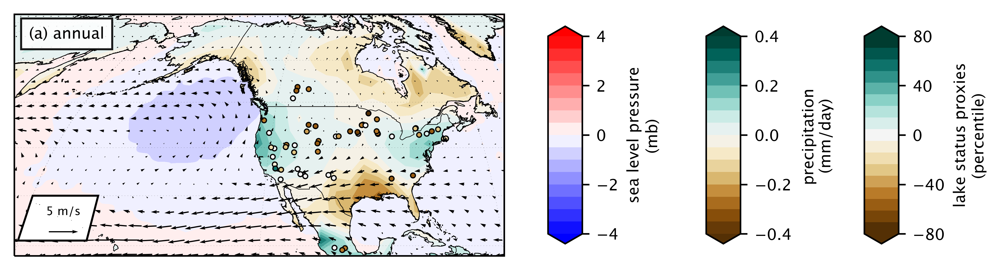

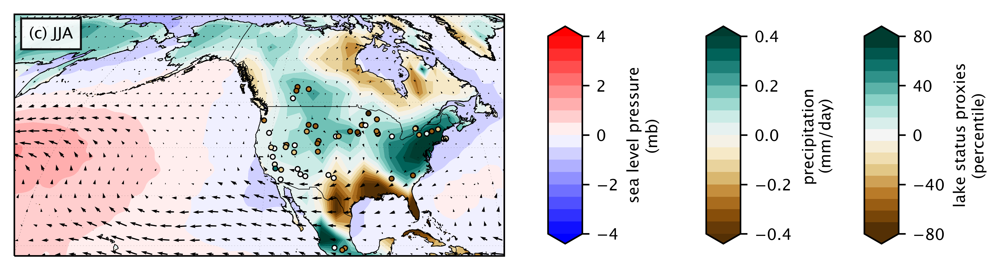

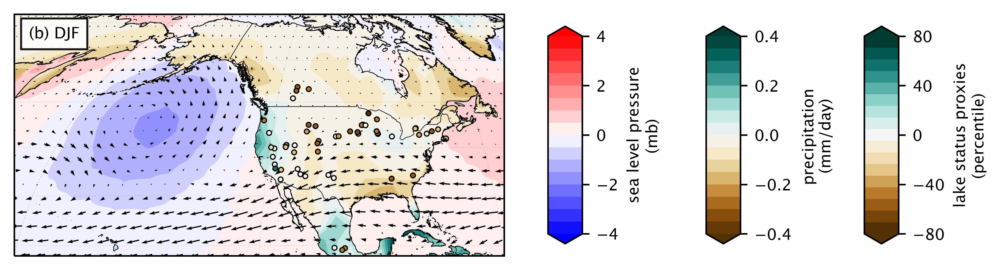

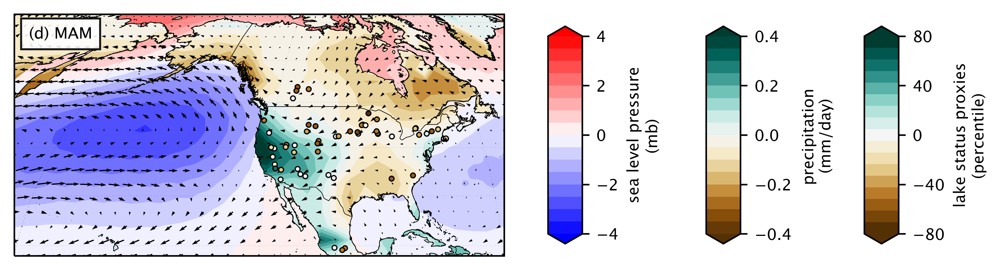

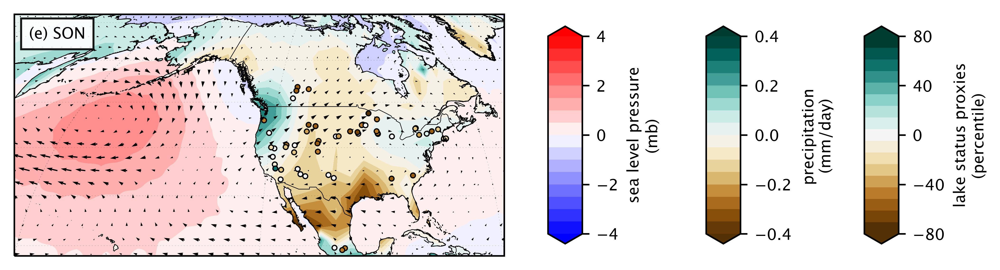

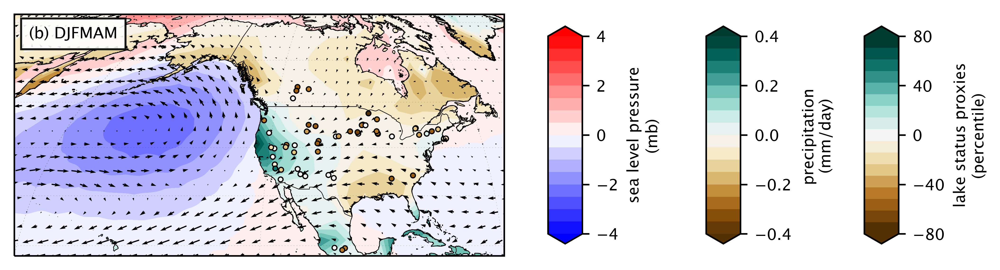

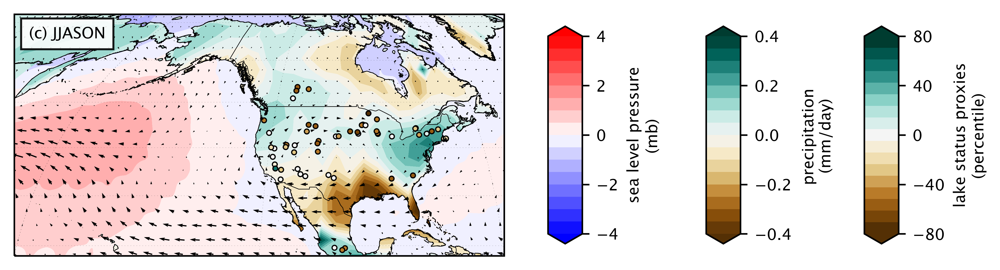

In [11]:
import matplotlib.patches as mpatches
model='Mult-Model Mean'
times = [age]
#model='HadCM'
model='Mult-Model Mean' #model='TraCE' #model='HadCM' 
# 0='ANN',1='JJA',2='DJF',3='MAM',4='SON'
for i in [[0],[1],[2],[3],[4],[2,3],[1,4]]:
    szn = "".join(np.array(['ANN','JJA','DJF','MAM','SON'])[i])
    if len(i)==1: name = ['a','c','b','d','e'][i[0]]
    elif i == [2,3]: name='b'
    elif i == [1,4]: name='c'
    if (szn=='ANN'): szn='annual'
    #Data
    precip   = xr.DataArray(np.split(np.mean(inputArray['precip'][:,i],axis=1),2,axis=0), 
                            coords={'model':['TraCE','HadCM'],'ages':inputArray['age'][:int(len(inputArray['age'])/2)],'lat':inputArray['lat'], 'lon':inputArray['lon']},
                            dims=["model","ages","lat","lon"]).sel(ages=slice(0,agemax))
    slpress  = xr.DataArray(np.split(np.mean(inputArray['slp'][:,i],axis=1),2,axis=0), 
                            coords={'model':['TraCE','HadCM'],'ages':inputArray['age'][:int(len(inputArray['age'])/2)],'lat':inputArray['lat'], 'lon':inputArray['lon']},
                            dims=["model","ages","lat","lon"]).sel(ages=slice(0,agemax))
    U200     = xr.DataArray(np.split(np.mean(inputArray['U200'][:,i],axis=1),2,axis=0), 
                          coords={'model':['TraCE','HadCM'],'ages':inputArray['age'][:int(len(inputArray['age'])/2)],'lat':inputArray['lat'], 'lon':inputArray['lon']},
                          dims=["model","ages","lat","lon"]).sel(ages=slice(0,agemax))
    V200     = xr.DataArray(np.split(np.mean(inputArray['V200'][:,i],axis=1),2,axis=0), 
                            coords={'model':['TraCE','HadCM'],'ages':inputArray['age'][:int(len(inputArray['age'])/2)],'lat':inputArray['lat'], 'lon':inputArray['lon']},
                            dims=["model","ages","lat","lon"]).sel(ages=slice(0,agemax))
    #
    proxylats= np.array([float(x[2]) for x in DAMPproxy['proxy_metadata']])
    proxylons= np.array([float(x[3]) for x in DAMPproxy['proxy_metadata']])
    #Select model    
    if model == 'Mult-Model Mean':
        precip,slpress = precip.mean(dim='model'),       slpress.mean(dim='model')
        U200,V200      = U200.mean(dim='model'),         V200.mean(dim='model')
    else:
        precip,slpress = precip[precip.model==model][0], press[press.model==model][0]
        U200,V200      = U200[U200.model==model][0],     V200[V200.model==model][0]
    #Anomaly
    V200   -= V200.sel(ages=slice(0,1000)).mean(dim='ages')
    U200   -= U200.sel(ages=slice(0,1000)).mean(dim='ages')
    precip -= precip.sel(ages=slice(0,1000)).mean(dim='ages')
    slpress-= slpress.sel(ages=slice(0,1000)).mean(dim='ages')
    proxies = DAMPproxy['proxy_values'] - DAMPproxy['proxy_values'].sel(ages=slice(0,1000)).mean(dim='ages')
    #mid-Holocene
    precip  = precip.sel(ages=slice(age-bs/2,age+bs/2)).mean(dim='ages')
    slpress = slpress.sel(ages=slice(age-bs/2,age+bs/2)).mean(dim='ages')
    proxies = proxies.sel(ages=slice(age-bs/2,age+bs/2)).mean(dim='ages')
    #land mask for sea level pressure
    slpress = regridder(slpress,keep_attrs=True)
    slpress = slpress.where(land==False)
    #
    #Plot
    plt.figure(figsize=(8,2),dpi=600)
    plt.rc('font', **font)
    for col,age in enumerate([age]):
        prelevs,slplevs = np.linspace(-0.4,0.4,17),np.linspace(-4,4,17)
        #Set up map
        ax = plt.subplot(projection=ccrs.Mollweide(central_longitude=260))
        da_plot.plotBaseMap(ax,proj,geo)
        ax.coastlines(resolution='10m',linewidth=0.3)
        ax.add_feature(cfeature.BORDERS,linewidth=0.3)
        ax.add_feature(cfeature.LAKES,alpha=0,linewidth=0.3,edgecolor='k')
        #
        ax.text(0.03, 0.9,'('+name+') '+szn, transform=ax.transAxes, fontsize=8).set_bbox(dict(facecolor='w', alpha=0.9, edgecolor='k'))
        #plot gridded data
        pre = ax.contourf(precip.lon,precip.lat,precip,
                           cmap='BrBG',levels=prelevs,transform=ccrs.PlateCarree(),extend='both')

        slp =  ax.contourf(slpress.lon,slpress.lat,slpress*10,
                           cmap='bwr',levels=slplevs,transform=ccrs.PlateCarree(),extend='both')
        X,Y= np.meshgrid(V200.lon,V200.lat)
        wnd = ax.quiver(X,Y,
                  U200.sel(ages=slice(age-bs/2,age+bs/2)).mean(dim='ages').data, 
                  V200.sel(ages=slice(age-bs/2,age+bs/2)).mean(dim='ages').data,
               transform=ccrs.PlateCarree(),pivot='tail',color='black')
        #Plot proxies
        idx=np.where(np.isfinite(proxies))[0]
        prox=ax.scatter(proxylons[idx],proxylats[idx],transform=ccrs.PlateCarree(),s=6,linewidth=0.6,ec='k',
                        c=proxies[idx],vmin=-80,vmax=80,cmap=plt.cm.get_cmap('BrBG',17))
        #ax.set_title(szn,fontsize=8,fontname='Sans')#+'\n'+model+'\n'+str(age/1000)+' (+/- 0.5) ka minus 1-0 ka')
        #Colorbar
        cb = plt.colorbar(pre,extend='both',ax=ax,orientation='vertical',
                          cax=inset_axes(ax,loc='center left',borderpad=35,width="7%",height="90%"),
                           ticks=prelevs[[0,4,8,12,16]])#, )
        cb.set_label(label='precipitation\n(mm/day)',fontsize=8,fontname='Sans')
        cb.ax.tick_params(labelsize=8)
        cb = plt.colorbar(slp,extend='both',ax=ax,orientation='vertical',
                          cax=inset_axes(ax,loc='center left',borderpad=27,width="7%",height="90%"),
                          ticks=slplevs[[0,4,8,12,16]])#, )
        cb.set_label(label='sea level pressure\n(mb)',fontsize=8,fontname='Sans')
        cb.ax.tick_params(labelsize=8)
        cb = plt.colorbar(prox,extend='both',ax=ax,orientation='vertical',
                          cax=inset_axes(ax,loc='center left',borderpad=43,width="7%",height="90%"),
                          ticks=(np.linspace(-80,80,17)[[0,4,8,12,16]]))#, ))#, )
        cb.set_label(label='lake status proxies\n(percentile)',fontsize=8,fontname='Sans')
        cb.ax.tick_params(labelsize=8)
        #
        # Add rectangle patch to the map
        if szn == 'annual':
            lon1, lon2, lat1, lat2 = 180, 197, 21, 30
            rectangle = mpatches.Rectangle((lon1, lat1), lon2 - lon1, lat2 - lat1, edgecolor='k', facecolor='w',transform=ccrs.PlateCarree())
            ax.add_patch(rectangle)
            ax.quiverkey(wnd, 0.1, 0.1, 5, '5 m/s', coordinates='axes',fontproperties={'size': 6}, color='k')
    plt.tight_layout()
    plt.savefig(wd+'Figures/Fig10/Fig10_NorthAmerica'+'_'+model+'_'+str(szn)+'.png',dpi=600, bbox_inches ="tight")
    plt.show

****===================Examine seasonality of precipitation in North America===================****

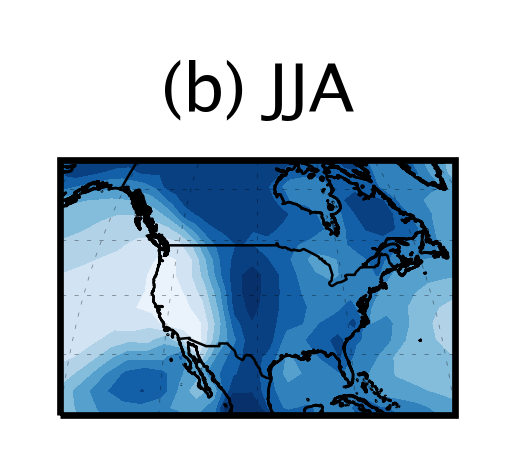

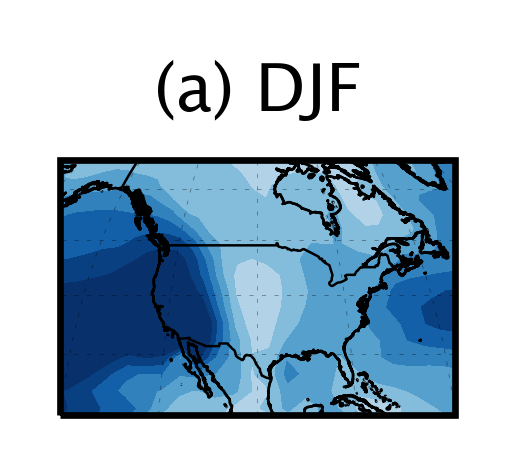

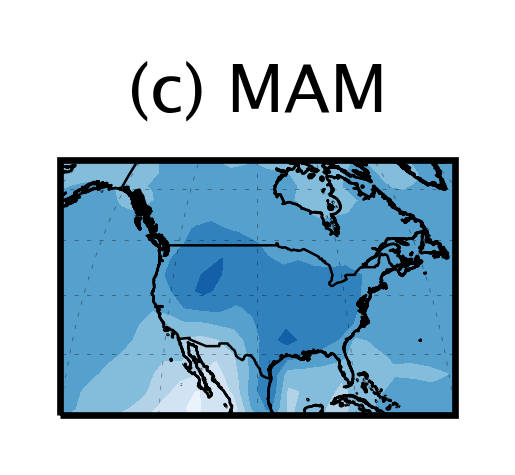

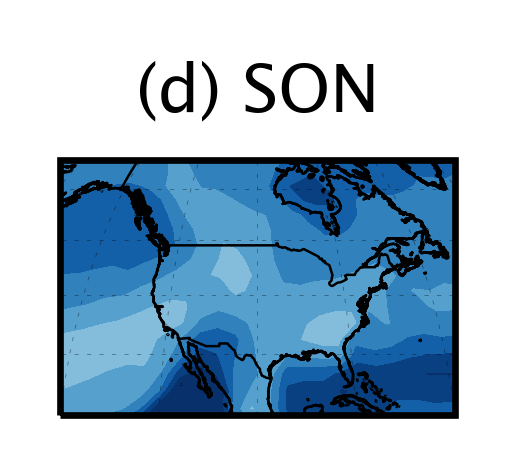

In [12]:
model='Mult-Model Mean' #model='TraCE' #model='HadCM' 
for row,szn in enumerate(['JJA','DJF','MAM','SON']):
    name = ['b','a','c','d'][row]
    #Data
    precip = xr.DataArray(np.split(np.mean(inputArray['precip'][:,[(row+1)]],axis=1),2,axis=0), 
                         coords={'model':['TraCE','HadCM'],
                                 'ages':inputArray['age'][:int(len(inputArray['age'])/2)],
                                 'lat':inputArray['lat'], 'lon':inputArray['lon']},
                         dims=["model","ages","lat","lon"]).sel(ages=slice(0,agemax))
    precipPct = (precip/(precipANN*4))*100
    if model != 'Mult-Model Mean': precipPct = precipPct[np.where(precipPct.model==model)]
    precipPct = precipPct.mean(dim='model').sel(ages=slice(0,1000)).mean(dim='ages')
    prelevs=np.linspace(0,40,9)
    #Plot set up
    plt.subplots(figsize=(5,5),dpi=600)
    plt.rc('font', **font)
    ax = plt.subplot(gs[0,0],projection=ccrs.Mollweide(central_longitude=260))
    da_plot.plotBaseMap(ax,proj,lims=[220,300,20,60])
    ax.coastlines(resolution='10m',zorder=3,linewidth=0.3)
    ax.add_feature(cfeature.BORDERS,linewidth=0.3)
    ax.add_feature(cfeature.LAKES,alpha=0,linewidth=0.3,edgecolor='k',zorder=4)
    ax.set_title('('+name+') '+szn,fontsize=8)
    #ax.text(0.04, 0.82,name+') '+szn, 
    #        transform=ax.transAxes, fontsize=8).set_bbox(dict(facecolor='w', edgecolor='w',pad=0.2))
    #Plot data
    pre = ax.contourf(precipPct.lon,precipPct.lat,precipPct,transform=ccrs.PlateCarree(),
                     levels=prelevs,cmap='Blues',extend='max')
    #Colorbar
    #cb = plt.colorbar(pre,ax=ax,orientation='horizontal',
    #                                  cax=inset_axes(ax,loc='lower center',borderpad=-1,width="90%",height="8%"),
    #                                  ticks=np.array(prelevs)[[0,2,4,6,8]])#, )
    #cb.set_label(label='Precipitation\n(% of Annual)',fontsize=8)
    #cb.ax.tick_params(labelsize=8)
    plt.tight_layout()
    plt.savefig(wd+'Figures/FigS10/FigS10_NorthAmerica'+'_percent_'+str(szn)+'.png',dpi=600, bbox_inches ="tight")
    plt.show()
